In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

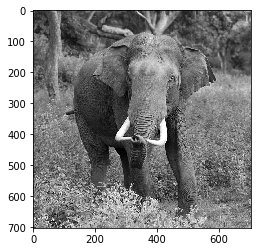

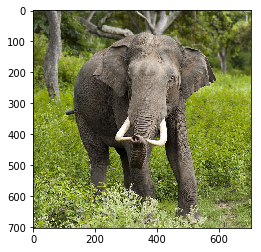

In [3]:
imageGray = cv2.imread("../pics/elephant2.jpg", cv2.IMREAD_GRAYSCALE)
plt.imshow(imageGray, "gray")
plt.show()

imageColor = cv2.imread("../pics/elephant2.jpg", cv2.IMREAD_COLOR)

b,g,r = cv2.split(imageColor)
imageColor = cv2.merge((r,g,b))

plt.imshow(imageColor)
plt.show()

uint8


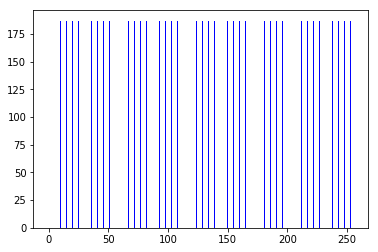

In [12]:
print (imageGray.dtype)
width = 0.35
x = np.arange(256)
hist = cv2.calcHist([imageGray],[0],None,[256],[0,256])
plt.bar(x, hist[0], width/3, color='b')
plt.show()
# it takes too much time 
#plt.hist(imageGray, bins='auto')
#plt.show()

In [7]:
flatImage = imageGray.flatten()
print (flatImage[5000])

91


In [15]:
def generateHistogram(image):
    
    cols = image.shape[0]
    rows = image.shape[1]
    if (len(image.shape) == 2 ):
        histData = np.zeros(256) # as a range 0 - 255 used
        flatImage = image.flatten()
        for i in range(image.size):
            histData[flatImage[i]] += 1
        #for i in xrange(cols):
        #    for j in xrange(rows):
        #        histData[image[i,j]] += 1
        return histData
    elif (len(image.shape) == 3):
        b,g,r = cv2.split(image)
        histData = [generateHistogram(b),generateHistogram(g),generateHistogram(r)]
        return histData

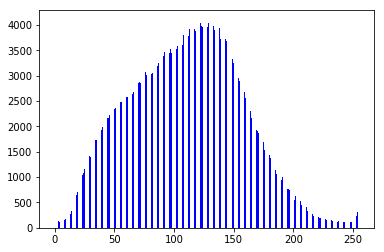

In [16]:
histog = generateHistogram(imageGray)
plt.bar(x, histog, width, color='b')
plt.show()

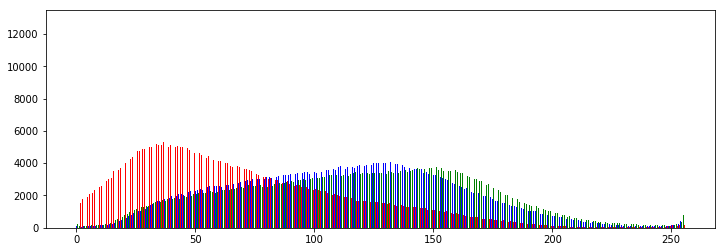

In [17]:
width = 0.9
x = np.arange(256)

fig_size = plt.rcParams["figure.figsize"]
histog = generateHistogram(imageColor)

plt.rcParams["figure.figsize"] = [12, 4]
plt.bar(x, histog[0], width/3, color='b')
plt.bar(x + width/3, histog[1], width/3, color='g')
plt.bar(x + 2*width/3, histog[2], width/3, color='r')
plt.show()

In [19]:
print (fig_size)

[6.0, 4.0]


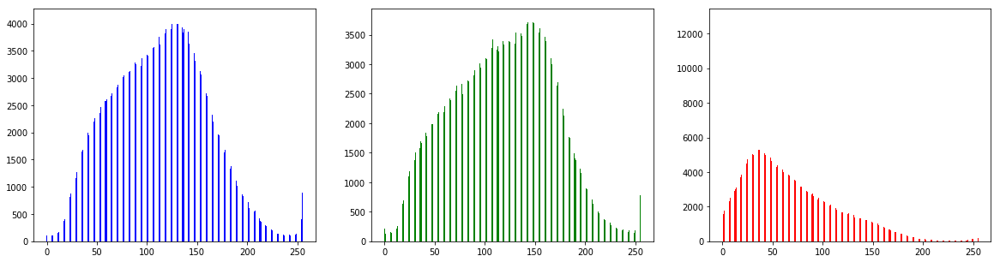

In [20]:
plt.close('all')
fig = plt.figure(figsize=(20,5))
ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)

ax1.bar(x, histog[0], width/3, color='b')
ax2.bar(x, histog[1], width/3, color='g')
ax3.bar(x, histog[2], width/3, color='r')
plt.show()

In [21]:
def equalizeHistogram(image):
    cols = image.shape[0]
    rows = image.shape[1]
    hist = generateHistogram(image)
    if (len(image.shape) == 2 ):
        sample = image.size
        histFunc = hist / float(sample)
        for i in range(1,hist.size):
            histFunc[i] = histFunc[i-1] + histFunc[i]
        new_image = np.zeros(image.shape, dtype=np.uint8)   
        for i in range(cols):
            for j in range(rows):
                new_image[i,j] = np.uint8( round(histFunc[image[i,j]] * image[i,j]) )
        return new_image
    elif (len(image.shape) == 3):
        b,g,r = cv2.split(image)
        b = equalizeHistogram(b)
        g = equalizeHistogram(g)
        r = equalizeHistogram(r)
        new_image = cv2.merge((b,g,r))
        return new_image

[ 48.  16.]


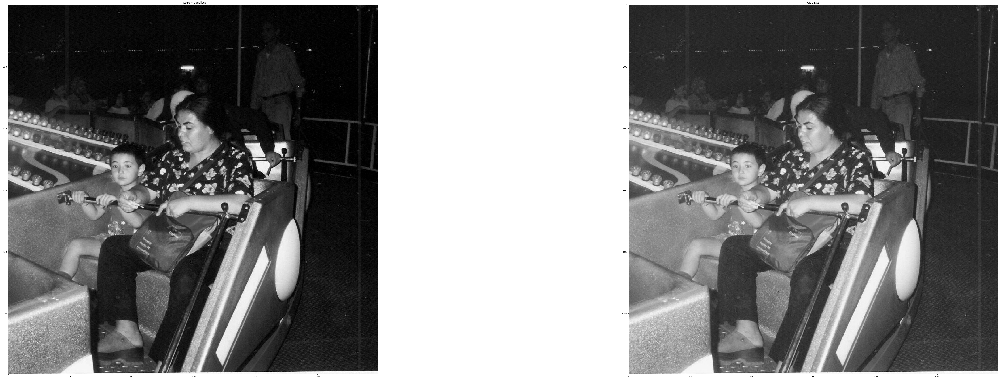

In [96]:
n_imageGray = equalizeHistogram(imageGray)

fig_size = np.array(plt.rcParams["figure.figsize"])
print (fig_size)
plt.rcParams["figure.figsize"] = 2*fig_size
plt.subplot(121),plt.imshow(n_imageGray, cmap='gray'),plt.title('Histogram Equalized')
plt.subplot(122),plt.imshow(imageGray, cmap='gray'),plt.title('ORIGINAL')
plt.show()

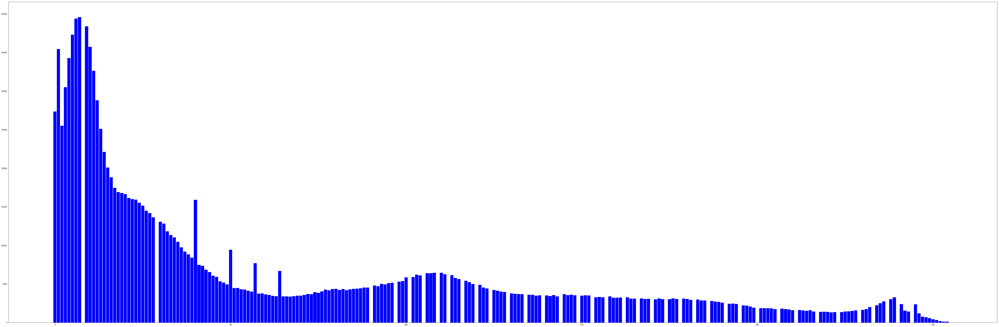

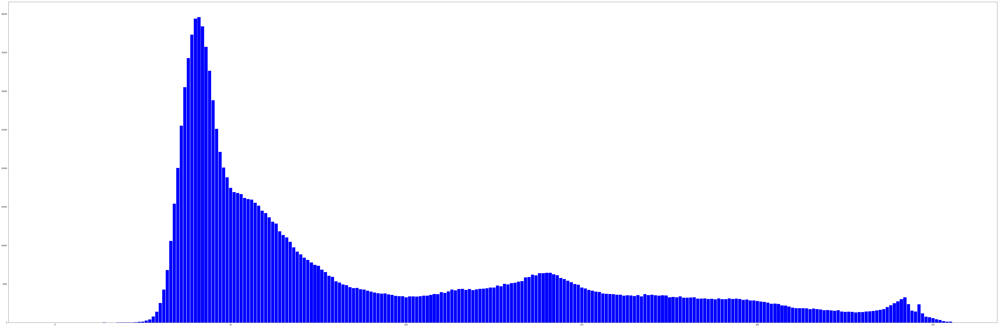

In [100]:
histog = generateHistogram(n_imageGray)
plt.bar(x, histog, width, color='b')
plt.show()
histog = generateHistogram(imageGray)
plt.bar(x, histog, width, color='b')
plt.show()

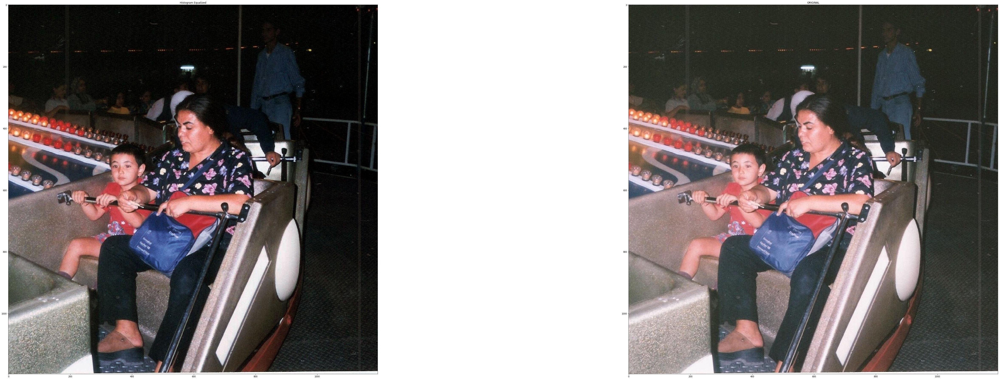

In [98]:
n_imageColor = equalizeHistogram(imageColor)
plt.subplot(121),plt.imshow(n_imageColor),plt.title('Histogram Equalized')
plt.subplot(122),plt.imshow(imageColor),plt.title('ORIGINAL')
plt.show()

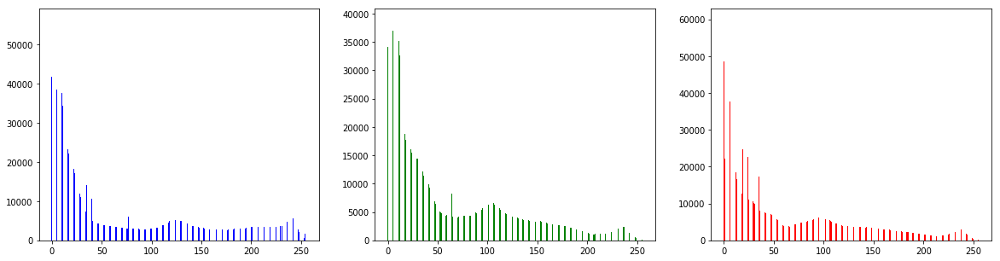

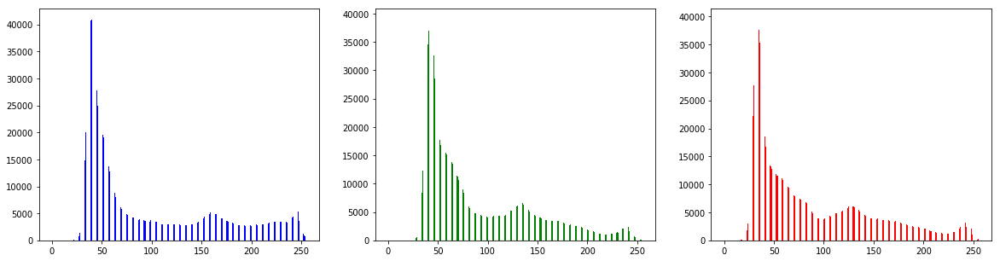

In [101]:
histog = generateHistogram(n_imageColor)
plt.close('all')
fig = plt.figure(figsize=(20,5))
ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)

ax1.bar(x, histog[0], width/3, color='b')
ax2.bar(x, histog[1], width/3, color='g')
ax3.bar(x, histog[2], width/3, color='r')
plt.show()

histog = generateHistogram(imageColor)
plt.close('all')
fig = plt.figure(figsize=(20,5))
ax1 = fig.add_subplot(1, 3, 1)
ax2 = fig.add_subplot(1, 3, 2)
ax3 = fig.add_subplot(1, 3, 3)

ax1.bar(x, histog[0], width/3, color='b')
ax2.bar(x, histog[1], width/3, color='g')
ax3.bar(x, histog[2], width/3, color='r')
plt.show()